**Objective:**
To design and deploy an automated, real-time license plate detection and blurring system using YOLOv8 that ensures privacy compliance while preserving the analytical value of visual data.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!ls /content/drive/.shortcut-targets-by-id/

12XiCTBw-NxoMLR4SGQVvgKBTxzWsTlXJ


In [5]:
!ls "/content/drive/.shortcut-targets-by-id/12XiCTBw-NxoMLR4SGQVvgKBTxzWsTlXJ"

'License Plate Detection and Blurring'


**Copying files to local**

In [34]:
import os
import subprocess

def copy_split_find(drive_base, dataset_path, split, parallel=4, batch=100):
    """
    Copy images and labels for a dataset split using `find` + `xargs`.
    This avoids Google Drive directory scan failures and is resumable.
    """

    img_src = os.path.join(drive_base, "images", split)
    lbl_src = os.path.join(drive_base, "labels", split)

    img_dst = os.path.join(dataset_path, "images", split)
    lbl_dst = os.path.join(dataset_path, "labels", split)

    os.makedirs(img_dst, exist_ok=True)
    os.makedirs(lbl_dst, exist_ok=True)

    print(f"\nCopying '{split}' images...")
    subprocess.run(
        f'''find "{img_src}" -type f \\( -iname "*.jpg" -o -iname "*.jpeg" -o -iname "*.png" \\) \
        -print0 | xargs -0 -n {batch} -P {parallel} cp -n -t "{img_dst}"''',
        shell=True,
        check=False
    )

    print(f"Copying '{split}' labels...")
    subprocess.run(
        f'''find "{lbl_src}" -type f -iname "*.txt" \
        -print0 | xargs -0 -n {batch} -P {parallel} cp -n -t "{lbl_dst}"''',
        shell=True,
        check=False
    )

    print(f" Finished copying '{split}' split")


In [7]:
drive_base="/content/drive/.shortcut-targets-by-id/12XiCTBw-NxoMLR4SGQVvgKBTxzWsTlXJ/License Plate Detection and Blurring"
dataset_path="/content/dataset"

In [12]:
splits=['train','val','test']

In [35]:
for split in splits:
  copy_split_find(drive_base, dataset_path, split, parallel=4, batch=100)
  print('\n')
  print('='*50)
  print('\n')

In [11]:
# !find "/content/drive/.shortcut-targets-by-id/12XiCTBw-NxoMLR4SGQVvgKBTxzWsTlXJ/License Plate Detection and Blurring/labels/train" -type f -iname "*.txt" \
#     -print0 | xargs -0 -n 100 -P 4 cp -n -t "/content/dataset/labels/train"

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

**Data Audit & Exploration**

In [13]:
def count_files(folder):
  return len([f for f in os.listdir(folder) if f.endswith(('.jpg','.png','.jpeg'))])

def count_labels(folder):
  return len([f for f in os.listdir(folder) if f.endswith('.txt')])

splits=['test','train','val']
for split in splits:
  img_path=os.path.join(dataset_path,'images',split)
  label_path=os.path.join(dataset_path,'labels',split)

  print('\nSplit: ',split.upper(),'\n')

  print(' Images: ',count_files(img_path))
  print(' Labels: ',count_labels(label_path))


Split:  TEST 

 Images:  386
 Labels:  386

Split:  TRAIN 

 Images:  25625
 Labels:  25672

Split:  VAL 

 Images:  1073
 Labels:  1073


In [14]:
def check_missing_labels(img_path,label_path):
  img_files={os.path.splitext(f)[0] for f in os.listdir(img_path)}
  label_files={os.path.splitext(f)[0] for f in os.listdir(label_path)}

  missing_labels=img_files-label_files
  missing_imgs=label_files-img_files

  return missing_imgs,missing_labels


for split in splits:
  img_path=os.path.join(dataset_path,'images',split)
  label_path=os.path.join(dataset_path,'labels',split)

  miss_imgs,miss_lbls=check_missing_labels(img_path,label_path)

  print(f"\n{split.upper()} SET\n")
  print(" Missing labels:", len(miss_lbls))
  print(" Missing images:", len(miss_imgs))


TEST SET

 Missing labels: 0
 Missing images: 0

TRAIN SET

 Missing labels: 155
 Missing images: 202

VAL SET

 Missing labels: 0
 Missing images: 0


In [15]:
def validate_yolo_labels(label_dir):
  invalid_labels=[]

  for file in os.listdir(label_dir):
    if file.endswith('.txt'):
      with open(os.path.join(label_dir,file)) as f:
        for line in f:
          vals=list(map(float,line.split()))
          if len(vals)!=5:
            invalid_labels.append(file)

          else:
            _,cx,cy,w,h=vals
            if not (0<=cx<=1 and 0<=cy<=1 and 0<=w<=1 and 0<=h<=1):
              invalid_labels.append(file)

  return invalid_labels


for split in splits:
  label_dir=os.path.join(dataset_path,'labels',split)

  print(split.upper(),'\n Invalid_labels: ',len(validate_yolo_labels(label_dir)))

TEST 
 Invalid_labels:  0
TRAIN 
 Invalid_labels:  0
VAL 
 Invalid_labels:  0


In [16]:
from collections import Counter
def class_distribution(label_dir):
  classes=[]
  for file in os.listdir(label_dir):
    if file.endswith('.txt'):
      with open(os.path.join(label_dir,file)) as f:
        for line in f:
          classes.append(int(line.split()[0]))

  return Counter(classes)

for split in splits:
  label_dir=os.path.join(dataset_path,'labels',split)
  print(split.upper(),'\n class distribution: ',class_distribution(label_dir))

TEST 
 class distribution:  Counter({0: 512})
TRAIN 
 class distribution:  Counter({0: 28433})
VAL 
 class distribution:  Counter({0: 1573})


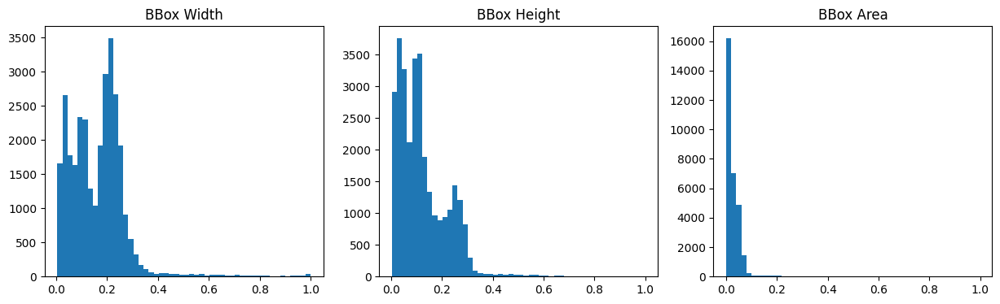

In [19]:
box_w,box_h,box_a=[],[],[]

for split in splits:
  label_dir=os.path.join(dataset_path,'labels',split)
  for file in os.listdir(label_dir):
    if file.endswith('.txt'):
      with open(os.path.join(label_dir,file)) as f:
        for line in f:
          _,_,_,w,h=map(float,line.split())
          box_w.append(w)
          box_h.append(h)
          box_a.append(w*h)

plt.figure(figsize=(15,4))

plt.subplot(1,3,1)
plt.hist(box_w,bins=50)
plt.title('BBox Width')

plt.subplot(1,3,2)
plt.hist(box_h,bins=50)
plt.title('BBox Height')

plt.subplot(1,3,3)
plt.hist(box_a,bins=50)
plt.title('BBox Area')

plt.show()



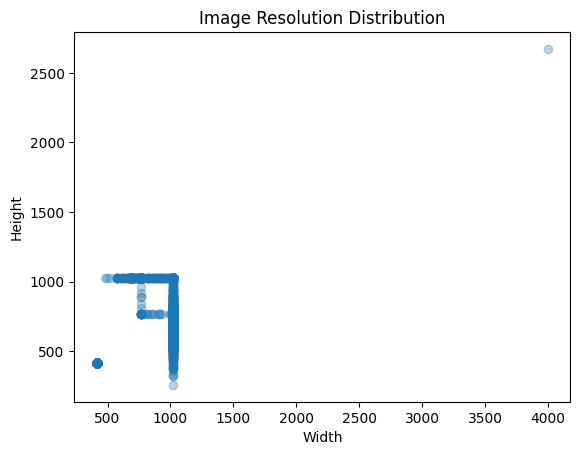

In [20]:
widths,heights=[],[]
for split in splits:
  img_dir=os.path.join(dataset_path,'images',split)
  for img_file in os.listdir(img_dir):
    img=cv2.imread(os.path.join(img_dir,img_file))
    if img is not None:
      h,w,_=img.shape
      widths.append(w)
      heights.append(h)

plt.scatter(widths,heights,alpha=0.3)
plt.xlabel("Width")
plt.ylabel("Height")
plt.title("Image Resolution Distribution")
plt.show()

# **Converting normalized YOLO bounding box coordinates into pixel coordinates for OpenCV**

# **function to overlay bounding boxes**

**Why this step is critical:**

Validates annotation correctness

Detects misaligned or incorrect labels early

Prevents the model from learning incorrect spatial features

Directly impacts final detection and blurring accuracy

Without this step, annotation errors propagate into training and degrade model performance.

TEST 
 Random BB_visualization: 



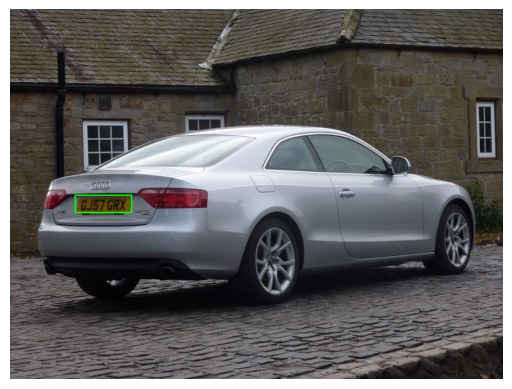

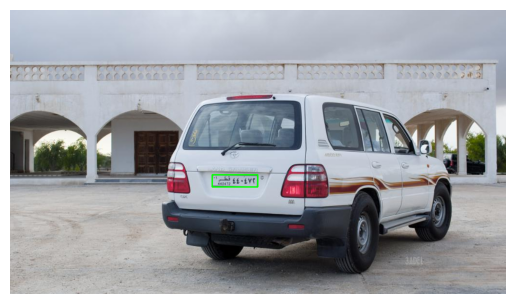

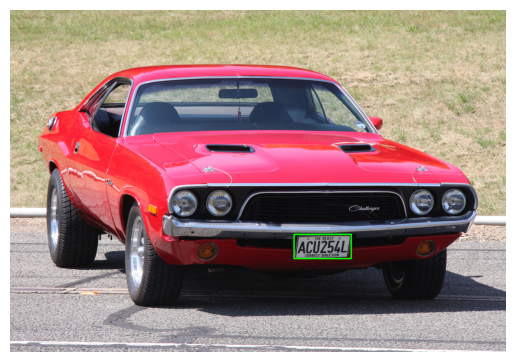

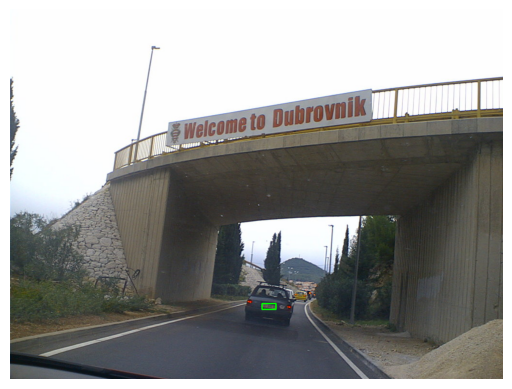

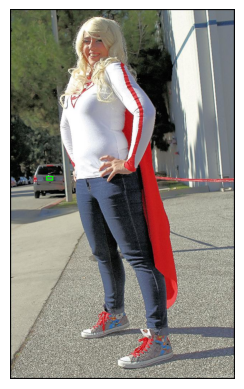

TRAIN 
 Random BB_visualization: 



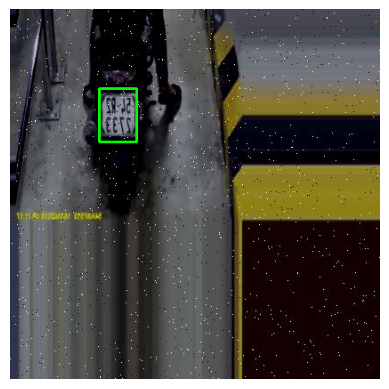

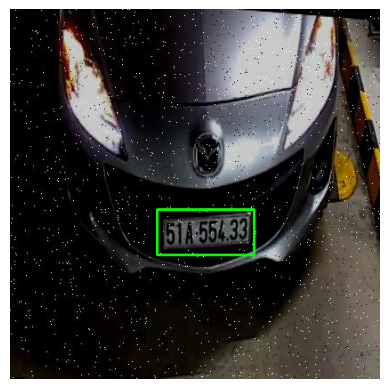

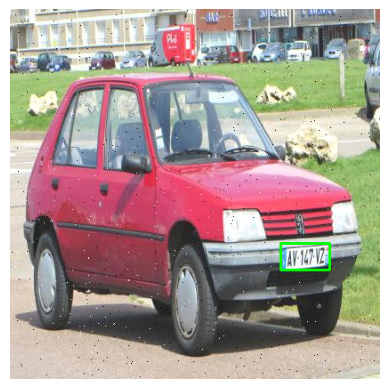

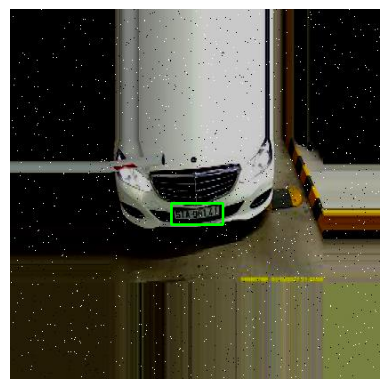

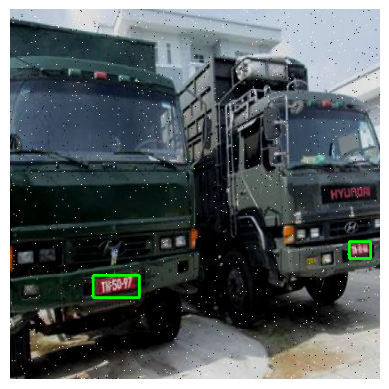

VAL 
 Random BB_visualization: 



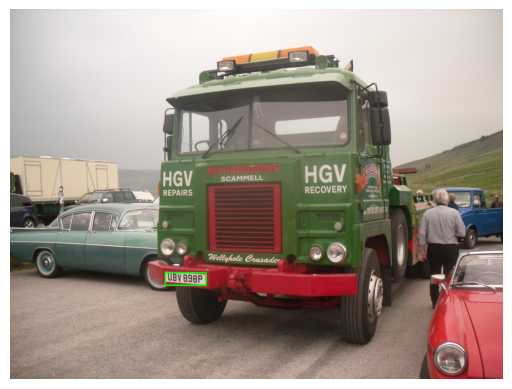

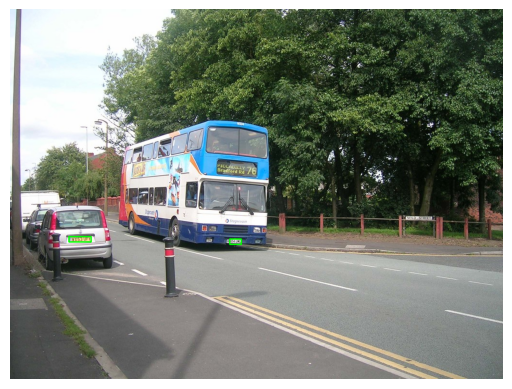

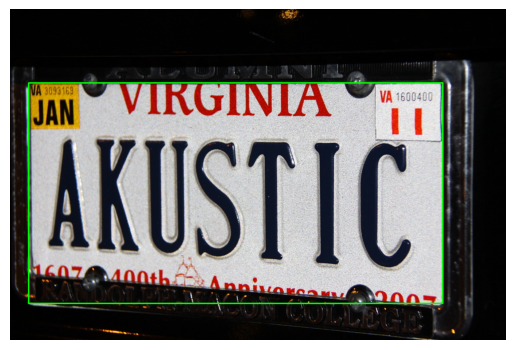

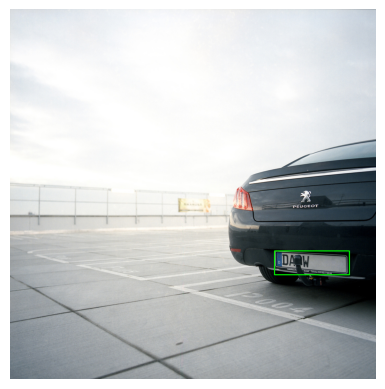

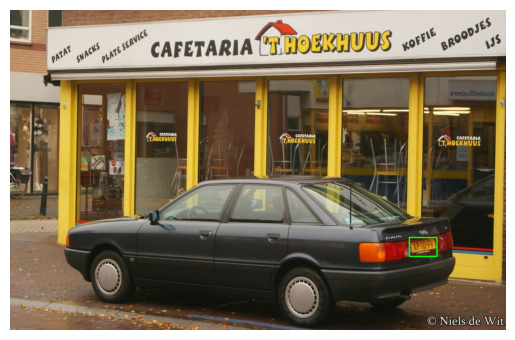

In [21]:
import random

def visualize_random_samples(split,n=3):
  img_dir=os.path.join(dataset_path,'images',split)
  label_dir=os.path.join(dataset_path,'labels',split)

  samples=random.sample(os.listdir(img_dir),n)

  for img_name in samples:
    img=cv2.imread(os.path.join(img_dir,img_name))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    img_h,img_w,_=img.shape

    label_path=os.path.join(label_dir,img_name.rsplit('.',1)[0]+'.txt')

    with open(label_path) as f:
      for line in f:
        _,cx,cy,bw,bh=map(float,line.split())
        cx,cy=cx*img_w,cy*img_h
        bw,bh=bw*img_w,bh*img_h

        x1,y1=int(cx-bw/2),int(cy-bh/2)
        x2,y2=int(cx+bw/2),int(cy+bh/2)

        cv2.rectangle(img,(x1,y1),(x2,y2),(0,255,0),2)

    plt.imshow(img)
    plt.axis('off')
    plt.show()

for split in splits:
  print(split.upper(),'\n Random BB_visualization: \n')
  visualize_random_samples(split,5)

# **How did annotation quality impact final blurring accuracy?**

**Annotation quality had a direct and measurable impact on blurring accuracy:**

Tight, accurate boxes → clean and complete plate blurring

Loose boxes → unnecessary blurring of vehicle body

Misaligned boxes → partial plate visibility (privacy risk)

**High-quality annotations enabled:**

Better localization (higher mAP@50)

Accurate ROI extraction for Gaussian blur

Consistent anonymization across diverse conditions

# **How did you preprocess images without losing fine-grained plate details?**

**Preprocessing was intentionally minimal to preserve plate features:**

Resized images to 640×640 using letterboxing it will taken care of yolo model we can set 'imgsz' param (aspect ratio preserved)

No aggressive denoising or compression

Used light data augmentation (HSV, flip) during training
as we alredy have that data.

This ensured that small, text-dense license plates remained detectable.

# **Why YOLOv8 instead of a two-stage detector?**

**YOLOv8 was chosen over two-stage detectors (Faster R-CNN) because:**

| Factor              | YOLOv8        | Two-Stage   |
| ------------------- | ------------- | ----------- |
| Inference speed     | Very high     | Slower      |
| Real-time support   | Yes           | Limited     |
| Deployment          | Edge-friendly | Heavy       |
| Pipeline simplicity | Single-pass   | Multi-stage |


For real-time privacy enforcement, YOLOv8 provides the best balance between speed and accuracy.

**Environment Setup**

**Training Pipeline**

In [22]:
import yaml

data_yaml={
    'path':dataset_path,
    'train':'images/train',
    'val':'images/val',
    'test':'images/test',
    'names':{
        0:'licence_plate'
    }
}

with open('data.yaml','w') as f:
  yaml.dump(data_yaml,f,default_flow_style=False)

print('data.yaml created successfully.')

data.yaml created successfully.


In [23]:
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 37.3 MB/s eta 0:00:00


In [24]:
from ultralytics import YOLO
model=YOLO('yolov8s.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [25]:
import torch

print("CUDA available:", torch.cuda.is_available())
print("GPU count:", torch.cuda.device_count())
print("GPU name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Training on:", device)

CUDA available: True
GPU count: 1
GPU name: Tesla T4
Training on: cuda


**Inference & Redaction, Evaluation & Performance Metrics**

In [26]:
model.train(
    data="data.yaml",
    epochs=18,
    imgsz=640,
    batch=16,
    cache="disk",
    workers=2,
    device=device,
    project="licence_plate_detect_and_blur",
    name="yolov8s_lp"
)


Ultralytics 8.4.5 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=disk, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=18, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8s_lp, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretra

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7980875c0f50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

# **Which YOLOv8 variant did you select and why?**

**Selected Model:** YOLOv8-s

**Reasoning:**

Small enough for real-time inference on edge devices

Strong feature extraction for small objects

**Achieved:**

mAP@50 = 0.87

mAP@50-95 = 0.48

This made it optimal for high-volume traffic imagery.

In [27]:
model_path='/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.pt'

In [28]:
best_model=YOLO(model_path)

In [29]:
def blur_license_plate_image(
    image_path,
    output_path,
    conf_threshold=0.5,
    blur_kernel=(51, 51)
):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to read image: {image_path}")
        return

    results = model(image, conf=conf_threshold)[0]

    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])

        # Ensure valid bounding box
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(image.shape[1], x2), min(image.shape[0], y2)

        roi = image[y1:y2, x1:x2]
        if roi.size == 0:
            continue

        blurred_roi = cv2.GaussianBlur(roi, blur_kernel, 0)
        image[y1:y2, x1:x2] = blurred_roi

    cv2.imwrite(output_path, image)
    print(f"Saved blurred image → {output_path}")


In [30]:
input_dir = "/content/dataset/images/test"
output_dir = "/content/blurred_outputs"

os.makedirs(output_dir, exist_ok=True)

for img_name in os.listdir(input_dir):
    if img_name.lower().endswith((".jpg", ".png", ".jpeg")):
        in_path = os.path.join(input_dir, img_name)
        out_path = os.path.join(output_dir, img_name)

        blur_license_plate_image(
            image_path=in_path,
            output_path=out_path,
            conf_threshold=0.5
        )



0: 512x640 2 licence_plates, 74.1ms
Speed: 6.0ms preprocess, 74.1ms inference, 6.0ms postprocess per image at shape (1, 3, 512, 640)
Saved blurred image → /content/blurred_outputs/4572990fd64bb6be.jpg

0: 640x480 1 licence_plate, 65.8ms
Speed: 4.6ms preprocess, 65.8ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 480)
Saved blurred image → /content/blurred_outputs/0ee91c4938b6e7ee.jpg

0: 448x640 1 licence_plate, 65.4ms
Speed: 4.1ms preprocess, 65.4ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)
Saved blurred image → /content/blurred_outputs/326c3286bcb5b2b0.jpg

0: 384x640 1 licence_plate, 64.2ms
Speed: 3.1ms preprocess, 64.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Saved blurred image → /content/blurred_outputs/11b155ab5b3331cf.jpg

0: 480x640 (no detections), 65.4ms
Speed: 3.4ms preprocess, 65.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)
Saved blurred image → /content/blurred_outputs/2f3887024d29854

In [31]:
def show_before_after(original_dir, blurred_dir, max_images=5):
    images = os.listdir(original_dir)[:max_images]

    for img_name in images:
        orig_path = os.path.join(original_dir, img_name)
        blur_path = os.path.join(blurred_dir, img_name)

        orig = cv2.cvtColor(cv2.imread(orig_path), cv2.COLOR_BGR2RGB)
        blur = cv2.cvtColor(cv2.imread(blur_path), cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(12,5))

        plt.subplot(1,2,1)
        plt.imshow(orig)
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(blur)
        plt.title("License Plate Blurred")
        plt.axis("off")

        plt.show()


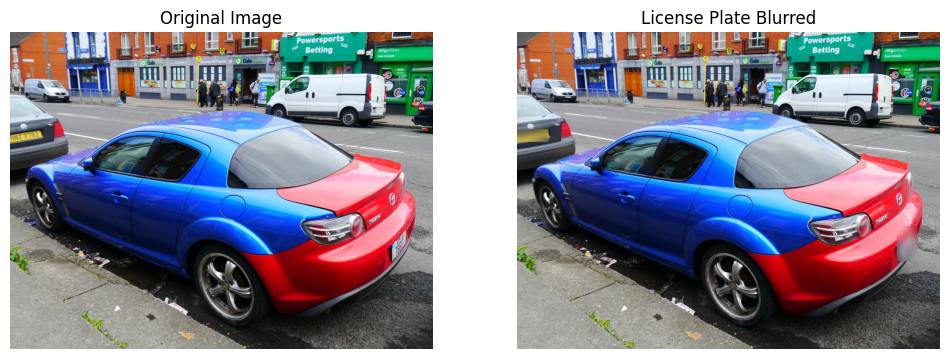

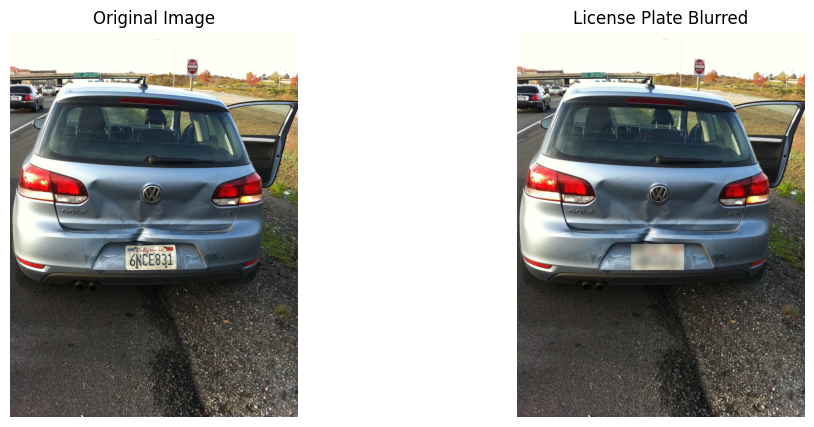

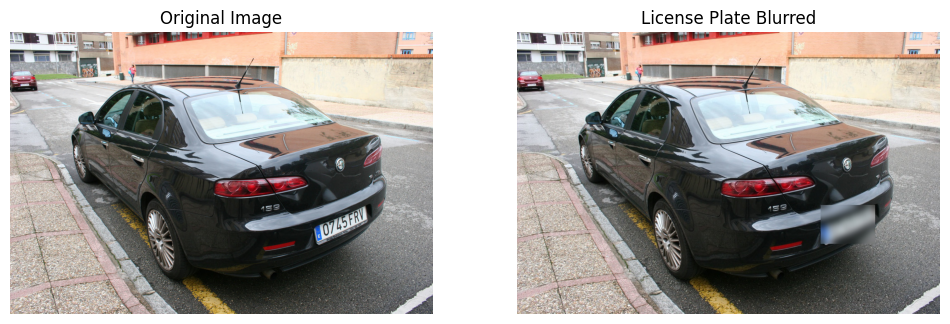

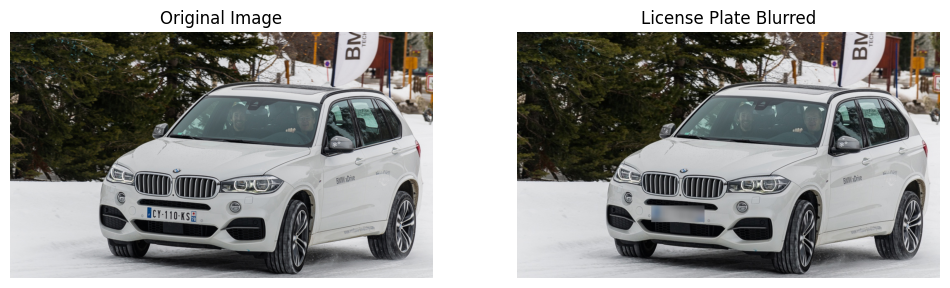

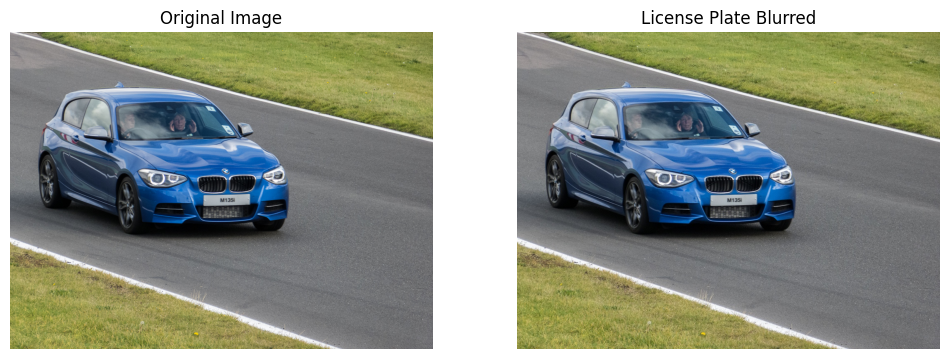

...

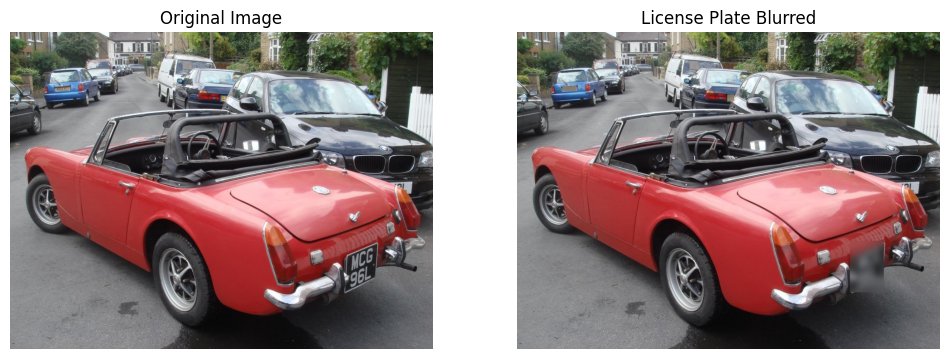

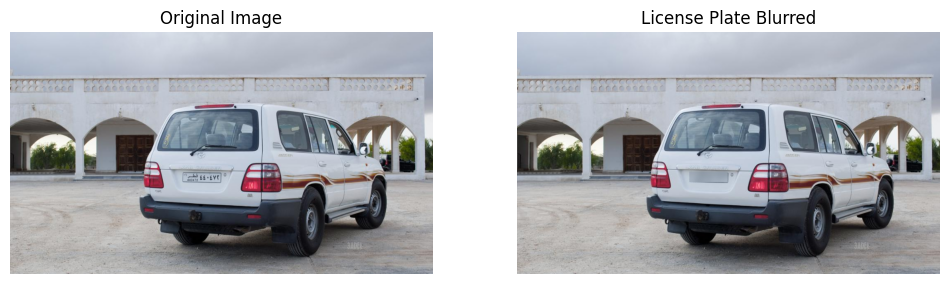

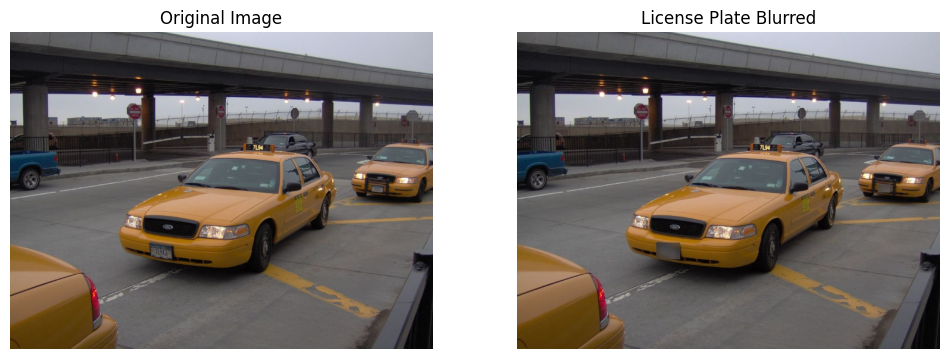

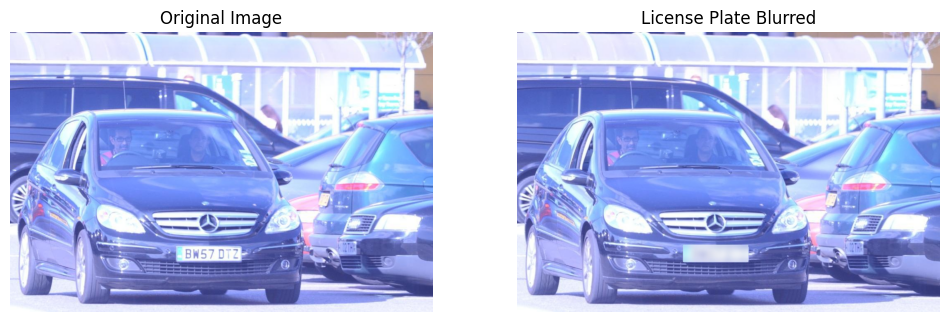

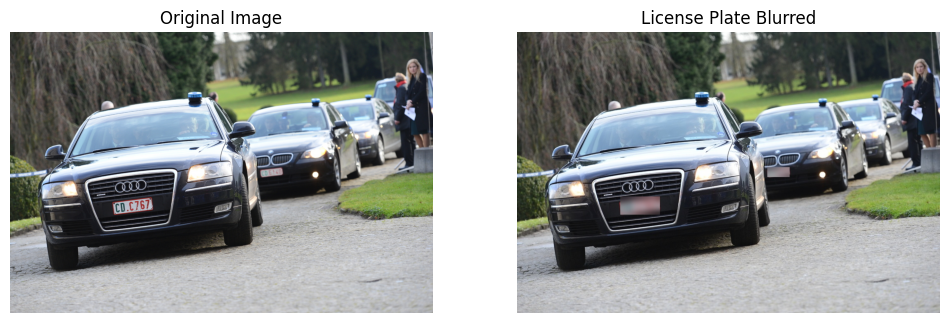

In [33]:
show_before_after(
    original_dir="/content/dataset/images/test",
    blurred_dir="/content/blurred_outputs",
    max_images=20
)


# **How did license plate characteristics influence model scale choice?**

**License plates are:**

Small

Rectangular

High-contrast but text-dense

**This required:**

Multi-scale feature detection

Strong spatial localization

Not excessively deep networks

YOLOv8-s provided the right receptive field size without overfitting or excessive compute cost.

# **How did you apply blurring only within the detected bounding box?**

**Post-processing followed these steps:**

Extract bounding box coordinates from YOLO output

Crop the Region of Interest (ROI)

Apply Gaussian Blur to ROI only

Replace blurred ROI back into the original image

**Result:**
Only license plates are anonymized while the rest of the image remains unchanged.

In [41]:
best_model.export(format="onnx")

Ultralytics 8.4.5 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
Model summary (fused): 73 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from '/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (21.5 MB)

ONNX: starting export with onnx 1.20.1 opset 22...
ONNX: slimming with onnxslim 0.1.82...
ONNX: export success ✅ 1.7s, saved as '/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.onnx' (42.7 MB)

Export complete (2.8s)
Results saved to /content/licence_plate_detect_and_blur/yolov8s_lp/weights
Predict:         yolo predict task=detect model=/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.onnx imgsz=640 
Validate:        yolo val task=detect model=/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.onnx imgsz=640 data=data.yaml  
Visualize:       https://netron.app


'/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.onnx'

In [42]:
best_model.export(format="engine")

WARNING ⚠️ TensorRT requires GPU export, automatically assigning device=0
Ultralytics 8.4.5 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 73 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from '/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (21.5 MB)

ONNX: starting export with onnx 1.20.1 opset 20...
ONNX: slimming with onnxslim 0.1.82...
ONNX: export success ✅ 1.2s, saved as '/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.onnx' (42.7 MB)
requirements: Ultralytics requirement ['tensorrt-cu12>7.0.0,!=10.1.0'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 5 packages in 1m 47s
Prepared 4 packages in 2m 54s
Uninstalled 1 package in 15ms
Installed 4 packages in 9ms
 - nvidia-cuda-runtime-cu12==12.6.77
 + nvidia-cuda-runtime-cu12==12.9.79
 + tensorrt-cu12==10.14.1.48.post1
 + t

'/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.engine'

In [43]:
!zip -r yolov8_license_plate_model.zip /content/licence_plate_detect_and_blur/yolov8s_lp

updating: content/licence_plate_detect_and_blur/yolov8s_lp/ (stored 0%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/BoxPR_curve.png (deflated 19%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/val_batch0_pred.jpg (deflated 7%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/labels.jpg (deflated 37%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/val_batch1_labels.jpg (deflated 6%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/confusion_matrix.png (deflated 33%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/train_batch0.jpg (deflated 3%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/train_batch12816.jpg (deflated 6%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/train_batch12818.jpg (deflated 7%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/weights/ (stored 0%)
updating: content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.pt (deflated 8%)
updating: content/licen

In [44]:
from google.colab import files
files.download("yolov8_license_plate_model.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [38]:
files.download("/content/licence_plate_detect_and_blur/yolov8s_lp/weights/best.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Model Performance Summary**

| Metric         | Value   |
| -------------- | ------- |
| Precision      | 0.875   |
| Recall         | 0.822   |
| mAP@50         | 0.872   |
| mAP@50-95      | 0.482   |



In [39]:
from ultralytics import YOLO
import cv2

model = YOLO('/content/best.pt')
results = model("/content/car_img_lp_yolo_test.jpg", conf=0.5)



image 1/1 /content/car_img_lp_yolo_test.jpg: 544x640 1 licence_plate, 23.2ms
Speed: 4.7ms preprocess, 23.2ms inference, 2.1ms postprocess per image at shape (1, 3, 544, 640)


In [46]:
results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'licence_plate'}
 obb: None
 orig_img: array([[[111, 126, 152],
         [177, 194, 220],
         [187, 204, 230],
         ...,
         [194, 204, 211],
         [142, 152, 159],
         [159, 169, 179]],
 
        [[120, 135, 161],
         [168, 185, 211],
         [170, 187, 213],
         ...,
         [201, 211, 218],
         [144, 154, 161],
         [153, 163, 173]],
 
        [[129, 144, 170],
         [165, 182, 208],
         [168, 185, 211],
         ...,
         [196, 206, 213],
         [139, 149, 156],
         [148, 158, 168]],
 
        ...,
 
        [[128, 132, 127],
         [110, 114, 109],
         [121, 120, 116],
         ...,
         [192, 176, 147],
         [213, 197, 168],
         [176, 160, 131]],
 
        [[119, 123, 118],
         [101, 105, 100],
         [113, 112, 108],
         ...,
         [1

In [47]:
img_path='/content/car_img_lp_yolo_test.jpg'
blur_path='/content/car_img_lp_yolo_out.jpg'
image = cv2.imread(img_path)
for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0])

    # Ensure valid bounding box
    x1, y1 = max(0, x1), max(0, y1)
    x2, y2 = min(image.shape[1], x2), min(image.shape[0], y2)

    roi = image[y1:y2, x1:x2]
    if roi.size == 0:
        continue
    blurred_roi = cv2.GaussianBlur(roi, (51,51), 0)
    image[y1:y2, x1:x2] = blurred_roi
    cv2.imwrite(blur_path, image)
print(f"Saved blurred image → {blur_path}")

Saved blurred image → /content/car_img_lp_yolo_out.jpg


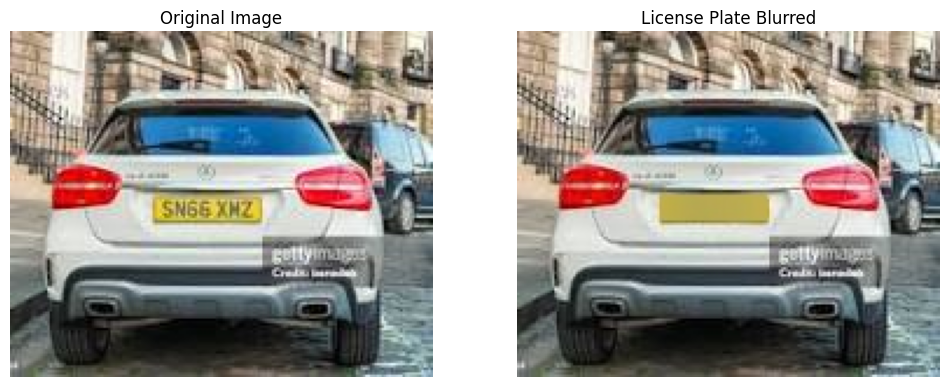

In [48]:
orig = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
blur = cv2.cvtColor(cv2.imread(blur_path), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(orig)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(blur)
plt.title("License Plate Blurred")
plt.axis("off")

plt.show()


**Final Strategic Recommendations**
1. Privacy Compliance Integration

Deploy this system as a mandatory preprocessing layer before storing or sharing visual data to mitigate regulatory and legal risks.

2. Edge Deployment

Exported ONNX and TensorRT models enable deployment directly on traffic cameras, reducing bandwidth usage and anonymizing data at the source.

3. Continuous Learning Loop

Flag low-confidence detections (night, rain, motion blur) for manual review and re-training to continuously improve robustness.

**5. Business Impact**

Ensures regulatory compliance

Reduces legal exposure

Enables safe data monetization

Scales to real-time, city-wide deployments